In [1]:
# Import packages
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPClassifier
from sklearn.impute import SimpleImputer
from IPython import display
import math
import plotly.express as px
import nbformat
from IPython.display import display, Latex
import matplotlib.dates as mdates
import missingno as msno 
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from statsmodels.tsa.arima_model import ARIMA
import kaleido

## Import

The data is first imported from a local drive.

In [2]:
df = pd.read_csv("c:\\Users\\olive\\OneDrive\\Documents\\Masters work\\AMI\\Assignments\\Summative 3\\data\\continuous_dataset.csv", parse_dates=['datetime'])
df.head()

,datetime,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
0,2015-01-03 01:00:00,970.3450,25.865259,0.018576,0.016174,21.850546,23.482446,0.017272,0.001855,10.328949,22.662134,0.016562,0.096100,5.364148,0,0,0
1,2015-01-03 02:00:00,912.1755,25.899255,0.018653,0.016418,22.166944,23.399255,0.017265,0.001327,10.681517,22.578943,0.016509,0.087646,5.572471,0,0,0
2,2015-01-03 03:00:00,900.2688,25.937280,0.018768,0.015480,22.454911,23.343530,0.017211,0.001428,10.874924,22.531030,0.016479,0.078735,5.871184,0,0,0
3,2015-01-03 04:00:00,889.9538,25.957544,0.018890,0.016273,22.110481,23.238794,0.017128,0.002599,10.518620,22.512231,0.016487,0.068390,5.883621,0,0,0
4,2015-01-03 05:00:00,893.6865,25.973840,0.018981,0.017281,21.186089,23.075403,0.017059,0.001729,9.733589,22.481653,0.016456,0.064362,5.611724,0,0,0


## Explore

We now perform some exploratory analysis to better understand the informational content of the data.

In [3]:
# Data shape
print(f' The data has {df.shape[1]} columns and {df.shape[0]} rows.')

 The data has 17 columns and 48048 rows.


### Missing values

In [4]:
# Check for missing values
missing_val_count = df.isnull().sum().sum() # the 2nd sum provides the value for the entire dataframe (rather than each column)
print(f'There are {missing_val_count} missing values in the df dataframe, which constitutes {np.round(missing_val_count/(df.shape[1]*df.shape[0])*100, 2)}% of the dateframe.')

There are 0 missing values in the df dataframe, which constitutes 0.0% of the dateframe.


There a no missing values in the data.

The code below produces simple summary statistics of each variable within the data.

In [5]:
sum_stat = df.describe().T.drop(['25%', '75%'], axis = 1)
sum_stat

,count,mean,min,50%,max,std
datetime,48048,2017-09-30 00:30:00,2015-01-03 01:00:00,2017-09-30 00:30:00,2020-06-27 00:00:00,NaN
nat_demand,48048.0,1182.868647,85.1925,1168.4277,1754.882,192.068896
T2M_toc,48048.0,27.399111,22.953455,27.118051,35.039575,1.675462
QV2M_toc,48048.0,0.018313,0.012054,0.01859,0.02269,0.001607
TQL_toc,48048.0,0.079979,0.0,0.065201,0.52124,0.065589
W2M_toc,48048.0,13.391049,0.008979,12.182103,39.229726,7.295502
T2M_san,48048.0,26.921023,19.765222,26.167352,39.06344,3.018129
QV2M_san,48048.0,0.017844,0.010247,0.018351,0.022165,0.001889
TQL_san,48048.0,0.106265,0.000009,0.085968,0.484985,0.086293
W2M_san,48048.0,7.046675,0.060394,5.992762,24.483937,4.103711


In [6]:
#sum_stat.to_latex(index = False, column_format='lrr')

### Line plots

We can now look to understand the time-series aspect of each variable by plotting line charts by variable.

<Figure size 1500x1200 with 0 Axes>

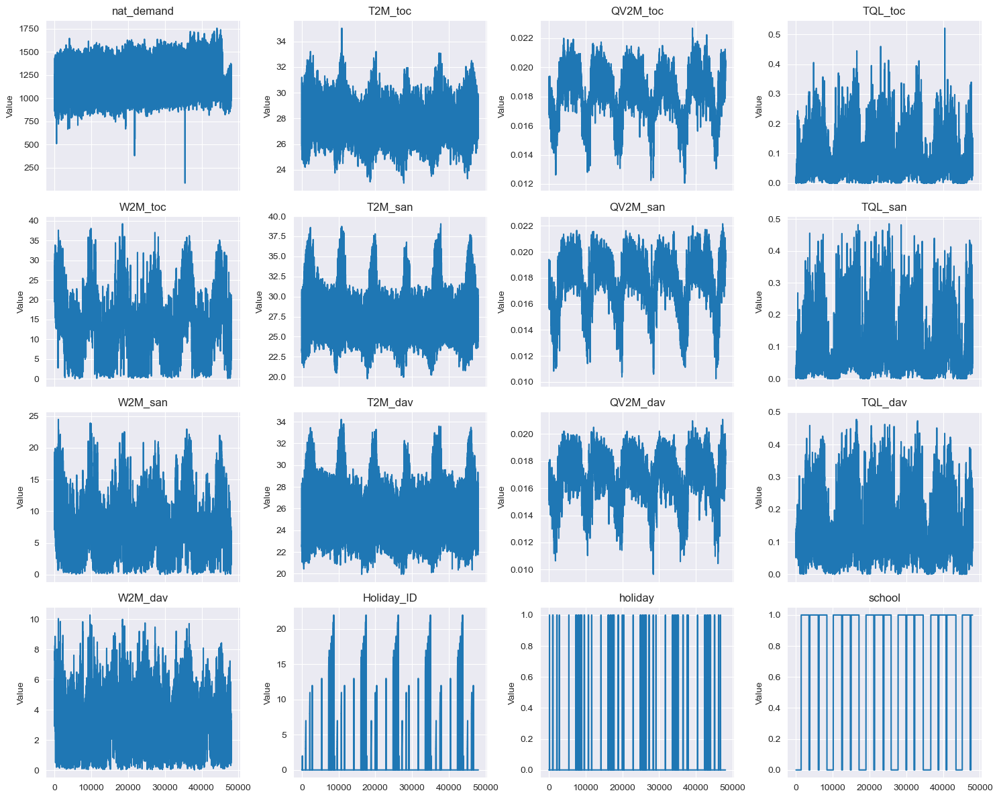

In [7]:
# Ploit cpi variable. Index 1990 = 199
# Create subplots for the numeric columns
features = df.drop('datetime', axis = 1)

plt.figure(figsize=(15, 12))

# Determine the number of numeric columns
num_columns = features.shape[1]

# Set the style for the plots (optional)
sns.set_style("darkgrid")

# Create subplots for each numeric column
fig, axes = plt.subplots(4, 4, figsize=(15, 12), sharex = True)

for i, col in enumerate(features.columns):
    row, col_num = divmod(i, 4)  # Calculate the row and column number
    sns.lineplot(data=features[col], ax=axes[row, col_num])
    axes[row, col_num].set_title(col)
    axes[row, col_num].set_xlabel('')
    axes[row, col_num].set_ylabel('Value')

# Show the plot
plt.tight_layout()
plt.savefig('timeseries.png')
plt.show()

Here we observe the cyclical seasonality of most variables. 

It also seems like the nat_demand variable exhibits an upwards trend over time.

## PCA

PCA can help a researcher understand the importance and corrlations between variables. Below we perform PCA on a standardised version of the data.

It is important to standardise the data to prevent large values over-influencing the results.

## Standardisation

In [8]:
# Standardise the features to put them over a common unit
standard = StandardScaler()
standard.fit(features)
features_standard = standard.transform(features)
features_standard_df = pd.DataFrame(features_standard, columns = features.columns, index=df['datetime']) 
features_standard_df

,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
datetime,,,,,,,,,,,,,,,,
2015-01-03 01:00:00,-1.106508,-0.915490,0.164145,-0.972807,1.159562,-1.139319,-0.303012,-1.209962,0.799839,-0.852272,-0.192089,-0.552702,1.050310,-0.223927,-0.259161,-1.635138
2015-01-03 02:00:00,-1.409369,-0.895199,0.212001,-0.969085,1.202931,-1.166883,-0.306725,-1.216085,0.885754,-0.886734,-0.225410,-0.648874,1.172100,-0.223927,-0.259161,-1.635138
2015-01-03 03:00:00,-1.471362,-0.872503,0.283289,-0.983393,1.242403,-1.185347,-0.334937,-1.214913,0.932885,-0.906581,-0.244592,-0.750255,1.346734,-0.223927,-0.259161,-1.635138
2015-01-03 04:00:00,-1.525067,-0.860409,0.359323,-0.971295,1.195192,-1.220050,-0.379309,-1.201347,0.846059,-0.914369,-0.239697,-0.867953,1.354006,-0.223927,-0.259161,-1.635138
2015-01-03 05:00:00,-1.505632,-0.850682,0.416005,-0.955941,1.068483,-1.274187,-0.415910,-1.211426,0.654759,-0.927036,-0.259248,-0.913783,1.195048,-0.223927,-0.259161,-1.635138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-26 20:00:00,-0.282763,-0.091060,1.238686,-0.373051,-0.562235,-0.399499,1.007331,0.177145,-1.232044,-0.403053,0.955714,0.070509,-0.656492,-0.223927,-0.259161,0.611569
2020-06-26 21:00:00,-0.365080,-0.178782,1.295704,-0.398409,-0.487092,-0.453373,0.946776,0.551665,-1.206778,-0.425100,0.917240,0.132310,-0.614892,-0.223927,-0.259161,0.611569
2020-06-26 22:00:00,-0.527424,-0.255429,1.328993,-0.346530,-0.428842,-0.506277,0.886227,0.443447,-1.133207,-0.439462,0.922116,0.097590,-0.448331,-0.223927,-0.259161,0.611569


The box plots below show how standardisation affects the distribution of each variable.

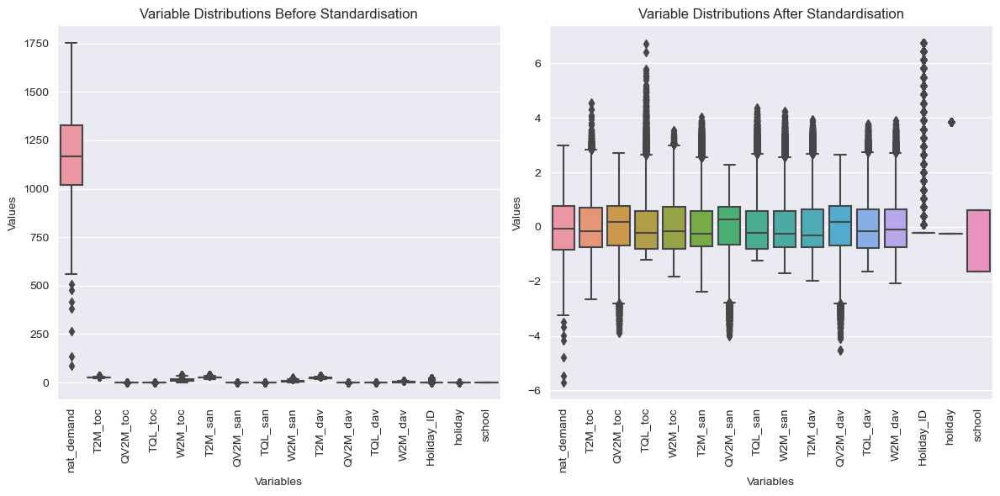

In [9]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot variable distributions before standardization in the first subplot
sns.boxplot(data=features, ax=axes[0])
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)  # Rotate x-axis labels for readability
axes[0].set_xlabel('Variables')
axes[0].set_ylabel('Values')
axes[0].set_title('Variable Distributions Before Standardisation')

# Plot variable distributions after standardization in the second subplot
sns.boxplot(data=features_standard_df, ax=axes[1])
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=90)  # Rotate x-axis labels for readability
axes[1].set_xlabel('Variables')
axes[1].set_ylabel('Values')
axes[1].set_title('Variable Distributions After Standardisation')

# Adjust the layout to prevent overlapping titles
plt.tight_layout()

# Show the combined plot
plt.savefig('boxplot.png')
plt.show()

## PCA

Below we perform PCA.

In [10]:
## Fit PCA to 95%
pca = PCA(n_components= 0.95) 
pca.fit(features_standard_df)

# Transform the data using the fitted model
pca_output = pca.transform(features_standard_df)

# Visualise the shape of the output
pca_output.shape

(48048, 10)

In [11]:
pca_output

array([[ 1.53208984, -2.5884096 , -0.35302957, ..., -0.28251433,
         0.60572849, -0.21860945],
       [ 1.58758594, -2.75025782, -0.31179673, ..., -0.30370475,
         0.86844689, -0.17172934],
       [ 1.65283326, -2.81019139, -0.28590694, ..., -0.22230644,
         0.9640144 , -0.12495014],
       ...,
       [-2.15563634, -0.53390431, -0.53801104, ..., -0.26100627,
         0.27228204,  0.45365308],
       [-2.0234206 , -0.75801608, -0.54275814, ..., -0.1976857 ,
         0.42804877,  0.085692  ],
       [-2.02323585, -0.89880236, -0.51573286, ..., -0.24054766,
         0.51892012, -0.06226878]])

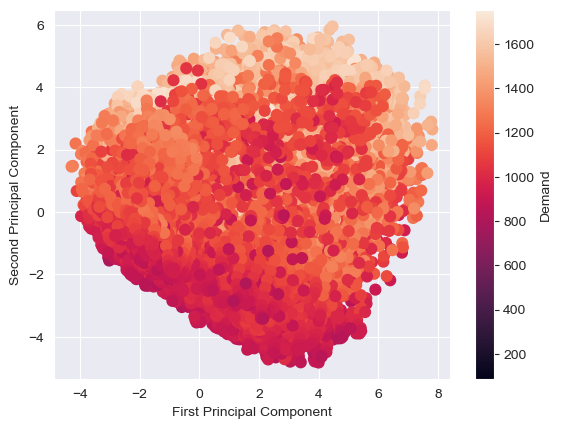

In [12]:
# Plot the first 2 principal components
plt.scatter(pca_output[:,0], pca_output[:,1], s=60, c = features['nat_demand'].values)
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.colorbar(label='Demand')
plt.show()

From the chart above, we see that high demand is typically correlated with large values of PCA1 and PCA2. Below, we add an additional dimension.

In [13]:

# Plot a 3d chart with PCAs on each axis
fig = plt.figure(figsize=(15, 8))
fig = px.scatter_3d(x=pca_output[:,0], y=pca_output[:,1], z=pca_output[:,2], color=features['nat_demand'].values,  opacity=0.2)

# Format chart
fig.update_layout(scene = dict(
                    xaxis_title=r'PCA 1',
                    yaxis_title=r'PCA 2',
                    zaxis_title=r'PCA 3'),
                    width=700,
                    margin=dict(r=0, b=0, l=0, t=0),
                    coloraxis_colorbar=dict(title='Demand'))
fig.show()


<Figure size 1500x800 with 0 Axes>

Now we see that along with the high values of PCA1 and PCA2, high levels of demand are also associated with low values of PCA3. In doing this, we have significantly reduced the feature space required to capture a large amount of variation in the data.

We can calculate the proportion of variance (or information) captured using a scree plot. 

In addition, we look to understand the variables underlying each PCA using a corrlation matrix with the original features.

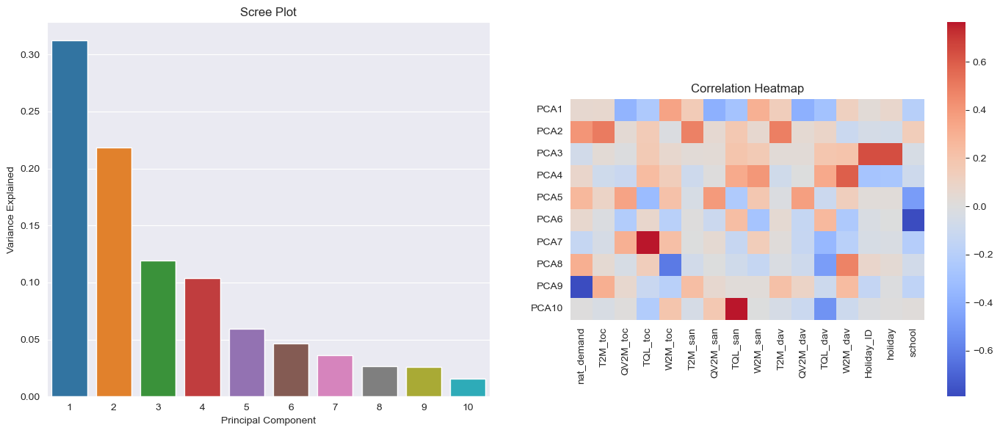

In [14]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot the Scree Plot in the first subplot
PC_values = np.arange(pca.n_components_) + 1
sns.barplot(x=PC_values, y=pca.explained_variance_ratio_, ax=axes[0])
axes[0].set_title('Scree Plot')
axes[0].set_xlabel('Principal Component')
axes[0].set_ylabel('Variance Explained')

# Plot the heatmap in the second subplot
ax = sns.heatmap(pca.components_,
                cmap='coolwarm',
                yticklabels=["PCA" + str(x) for x in range(1, pca.n_components_ + 1)],
                xticklabels=list(features.columns),
                cbar_kws={"orientation": "vertical"},
                center=0, ax=axes[1])
ax.set_aspect("equal")

# Rotate the y-axis tick labels for the heatmap
plt.setp(ax.get_yticklabels(), rotation=0)  # Adjust the rotation angle as needed

axes[1].set_title('Correlation Heatmap')

# Adjust the layout to prevent overlapping titles and make the left plot smaller
plt.tight_layout(w_pad=4)

# Show the combined plot
plt.savefig('pca_results.png')
plt.show()

## Create the target variable

We now create the target variable which will be demand 24 hours ahead.

In [15]:
# Identify target variable
target_var = "nat_demand"

# Specify forecast horizon of 24 hours
forecast_lead = 24
target = f"{target_var}_lead{forecast_lead}"

# Shift the target variable and drop the final 24 rows without a target
features_standard_df[target] = features_standard_df[target_var].shift(-forecast_lead)
features_standard_df = features_standard_df.iloc[:-forecast_lead]
features_standard_df.head()

,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school,nat_demand_lead24
datetime,,,,,,,,,,,,,,,,,
2015-01-03 01:00:00,-1.106508,-0.915490,0.164145,-0.972807,1.159562,-1.139319,-0.303012,-1.209962,0.799839,-0.852272,-0.192089,-0.552702,1.050310,-0.223927,-0.259161,-1.635138,-1.243385
2015-01-03 02:00:00,-1.409369,-0.895199,0.212001,-0.969085,1.202931,-1.166883,-0.306725,-1.216085,0.885754,-0.886734,-0.225410,-0.648874,1.172100,-0.223927,-0.259161,-1.635138,-1.323233
2015-01-03 03:00:00,-1.471362,-0.872503,0.283289,-0.983393,1.242403,-1.185347,-0.334937,-1.214913,0.932885,-0.906581,-0.244592,-0.750255,1.346734,-0.223927,-0.259161,-1.635138,-1.423004
2015-01-03 04:00:00,-1.525067,-0.860409,0.359323,-0.971295,1.195192,-1.220050,-0.379309,-1.201347,0.846059,-0.914369,-0.239697,-0.867953,1.354006,-0.223927,-0.259161,-1.635138,-1.500594
2015-01-03 05:00:00,-1.505632,-0.850682,0.416005,-0.955941,1.068483,-1.274187,-0.415910,-1.211426,0.654759,-0.927036,-0.259248,-0.913783,1.195048,-0.223927,-0.259161,-1.635138,-1.552598


## LSTM in Pytorch

### Train-test split

As with all machine learning models, we will need data to test ourt-of-sample performance. In time-series data it is often good to use the final X% ofobservations. This prevent data leakage - where some future data influences the model parameters. This would ultimately lead to overfitting and limited out-of-sample performance.

In [16]:
# Create train-test split with most recent observations as test observations
df_train, df_test= train_test_split(features_standard_df, test_size=0.20, shuffle= False)

# Save training target mean and std for later rescaling
target_mean = df_train[target].mean()
target_stdev = df_train[target].std()

In [17]:
print(f'The training dataset spans {min(df_train.index)} to {max(df_train.index)}\nThe testing dataset spans {min(df_test.index)} to {max(df_test.index)}')

The training dataset spans 2015-01-03 01:00:00 to 2019-05-22 19:00:00
The testing dataset spans 2019-05-22 20:00:00 to 2020-06-26 00:00:00


### LSTM model training

To train the LSTM model in pytorch, we will provide the model with a series of sequential observations, which we will call a batch. 

The code below creates a sequence dataset, which will capture the n rows of sequentual observations. If there are no earlier rows (at the start of the dataset), the __getitem__ method will pad the data with repeated observations.

In [18]:
# Create class from PyTorch Dataset class
class SequenceDataset(Dataset):

    def __init__(self, dataframe, target, features, sequence_length=5):
        # Initialize the dataset with required parameters
        self.features = features        # List of feature column names
        self.target = target            # Name of the target column
        self.sequence_length = sequence_length  # Length of sequences
        
        # Convert target and feature data in the dataframe to PyTorch tensors
        self.y = torch.tensor(dataframe[target].values).float()
        self.X = torch.tensor(dataframe[features].values).float()

    def __len__(self):
        # Return the number of samples in the dataset (number of rows)
        return self.X.shape[0]

    def __getitem__(self, i):
        # Retrieve a single sequence and its target given an index 'i'
        if i >= self.sequence_length - 1:
            i_start = i - self.sequence_length + 1
            # Extract a sequence of length 'sequence_length'
            x = self.X[i_start:(i + 1), :]
        else:
            # If the index is not within the sequence length, pad repeated observations
            padding = self.X[0].repeat(self.sequence_length - i - 1, 1)
            x = self.X[0:(i + 1), :]
            x = torch.cat((padding, x), 0)

        # Return the sequence 'x' and its corresponding target 'y'
        return x, self.y[i]

The code below then creates sequence datasets for the train and test data. 

The DataLoader method is then used to pass 'minibatches' and resuffle the data at each epoch. Reshuffling is not neccessary for the testing data.

In [19]:
# Set a random seed for reproducibility
torch.manual_seed(101)

# Define batch size and sequence length
batch_size = 4
sequence_length = 24

# Create training and testing datasets using the custom SequenceDataset class
train_dataset = SequenceDataset(
    df_train,                 # Training dataframe
    target=target,           # Name of the target column
    features=features.columns,  # List of feature column names
    sequence_length=sequence_length  # Length of sequences
)
test_dataset = SequenceDataset(
    df_test,                  # Testing dataframe
    target=target,           # Name of the target column
    features=features.columns,  # List of feature column names
    sequence_length=sequence_length  # Length of sequences
)

# Create data loaders to batch and shuffle the data for training and testing
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Fetch a single batch of data from the training loader
X, y = next(iter(train_loader))

# Print the shapes of the features and target tensors in the batch
print("Features shape:", X.shape)
print("Target shape:", y.shape)

Features shape: torch.Size([4, 24, 16])
Target shape: torch.Size([4])


### Create single layer

In this example we use a simple, single-layer LSTM model. 

The code below creates a model class using the nn.Module class. Note that we specify the batch number to be the first dimension in the tensor input.

In [20]:
class ShallowRegressionLSTM(nn.Module):
    def __init__(self, num_sensors, hidden_units):
        super().__init__()
        self.num_sensors = num_sensors  # Number of input features
        self.hidden_units = hidden_units  # Number of hidden units in the LSTM layer
        self.num_layers = 1  # Number of LSTM layers (set to 1 for a shallow LSTM)

        # Define the LSTM layer
        self.lstm = nn.LSTM(
            input_size=num_sensors,  # Input size (number of features)
            hidden_size=hidden_units,  # Hidden state size
            batch_first=True,  # Input data will have batch size as the first dimension
            num_layers=self.num_layers  # Number of LSTM layers
        )

        # Define the output linear layer
        self.linear = nn.Linear(in_features=self.hidden_units, out_features=1)

    def forward(self, x):
        batch_size = x.shape[0]  # Get the batch size from the input data
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_units).requires_grad_()
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_units).requires_grad_()
        
        # Pass the input data through the LSTM layer
        _, (hn, _) = self.lstm(x, (h0, c0))
        
        # Extract the hidden state (output) from the LSTM layer and pass it through the linear layer
        out = self.linear(hn[0]).flatten()  # First dim of Hn is num_layers, which is set to 1 above.

        return out

In [21]:
# Specify learning rate and number of hidden units
learning_rate = 0.01
num_hidden_units = 16

model = ShallowRegressionLSTM(num_sensors=len(features.columns), hidden_units=num_hidden_units)
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [22]:
# Define a function to train a machine learning model using a given data loader
def train_model(data_loader, model, loss_function, optimizer):
    num_batches = len(data_loader)
    total_loss = 0
    model.train()  # Set the model in training mode
    
    # Iterate through the data loader
    for X, y in data_loader:
        output = model(X)  # Forward pass to get model predictions
        loss = loss_function(output, y)  # Calculate the loss
        
        optimizer.zero_grad()  # Clear the gradients from the previous iteration
        loss.backward()  # Backpropagate the gradients
        optimizer.step()  # Update model parameters based on gradients
        
        total_loss += loss.item()  # Accumulate the loss for this batch

    avg_loss = total_loss / num_batches  # Calculate the average loss
    print(f"Train loss: {avg_loss}")  # Print the average training loss

# Define a function to test the model using a given data loader
def test_model(data_loader, model, loss_function):
    num_batches = len(data_loader)
    total_loss = 0

    model.eval()  # Set the model in evaluation mode
    with torch.no_grad():
        for X, y in data_loader:
            output = model(X)  # Forward pass to get model predictions
            total_loss += loss_function(output, y).item()  # Calculate the loss

    test_avg_loss = total_loss / num_batches  # Calculate the average loss
    print(f"Test loss: {test_avg_loss}")  # Print the average test loss

    return test_avg_loss

# Print a message indicating untrained testing
print("Untrained test\n--------")
test_model(test_loader, model, loss_function)
print()

# Loop through training epochs
for ix_epoch in range(3):
    print(f"Epoch {ix_epoch}\n---------")
    train_model(train_loader, model, loss_function, optimizer=optimizer)  # Train the model
    test_model(test_loader, model, loss_function)  # Test the model
    print()

Untrained test
--------
Test loss: 1.1320638442570987

Epoch 0
---------
Train loss: 0.24109960811510575
Test loss: 0.4000234745729356

Epoch 1
---------
Train loss: 0.19678373743299934
Test loss: 0.42541201733579603

Epoch 2
---------
Train loss: 0.18573660552098376
Test loss: 0.36618173152559125



In [23]:
# Define a function to make predictions using the trained model on a given data loader
def predict(data_loader, model):
    output = torch.tensor([])  # Initialize an empty tensor to store model predictions
    model.eval()  # Set the model in evaluation mode (no gradient computation)

    with torch.no_grad():
        # Iterate through the data loader
        for X, _ in data_loader:
            y_star = model(X)  # Use the model to make predictions on input data
            output = torch.cat((output, y_star), 0)  # Concatenate predictions along rows
    
    return output  # Return the tensor containing model predictions

# Create a data loader for evaluating the training dataset
train_eval_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

ystar_col = "lstm_forecast"  # Define a column name for model forecasts in the DataFrame

# Make predictions on the training and test datasets and store them in DataFrames
df_train[ystar_col] = predict(train_eval_loader, model).numpy()
df_test[ystar_col] = predict(test_loader, model).numpy()

# Combine the training and test DataFrames and select relevant columns
df_out = pd.concat((df_train, df_test))[[target, ystar_col]]

# Rescale the columns to their original scale using mean and standard deviation
for c in df_out.columns:
    df_out[c] = df_out[c] * target_stdev + target_mean

# Extract the actual target values and predicted values
actual_values = df_out[target].values
predicted_values = df_out[ystar_col].values

# Calculate the RMSE
rmse = np.sqrt(mean_squared_error(actual_values, predicted_values))

# Calculate R-squared (R^2)
r_squared = r2_score(actual_values, predicted_values)

# Create a new DataFrame with the RMSE, R-squared, and "model" column
results_df = pd.DataFrame({'Model': ['LSTM'], 'RMSE': [rmse]})
results_df


,Model,RMSE
0,LSTM,0.458001


In [24]:
# Create a line plot 
fig = px.line(df_out, labels=dict(created_at="Date", value="PM2.5 (ug/m3)"))

# Add a vertical line at the minimum index of the test data for reference
fig.add_vline(x=min(df_test.index), line_width=4, line_dash="dash")

# Update the layout 
fig.update_layout(
    legend=dict(orientation='h', y=1.02, title_text="")  )

# Display the finalized plot
fig.show()

## SKlearn - ARIMA, Random Forest and KNN

In [25]:
# Create a list of models with hyperparameter grids
models = [
    {
        'name': 'KNeighborsRegressor',
        'model': KNeighborsRegressor(),
        'param_grid': {
            'n_neighbors': [1, 2, 5],
            'weights': ['uniform', 'distance'],
        }
    },
    {
        'name': 'RandomForestRegressor',
        'model': RandomForestRegressor(),
        'param_grid': {
            'n_estimators': [10, 25, 100],
            'max_depth': [10, 20],
        }
    }
]


In [26]:

# Create an empty DataFrame to store the performance results
performance_table = pd.DataFrame(columns=["Model", "RMSE", "R2 Score"])

# Remove forecast figures from the training and test data
X_train = df_train.drop([target, 'lstm_forecast'], axis=1)
y_train = df_train[target]
X_test = df_test.drop([target, 'lstm_forecast'], axis=1)
y_test = df_test[target]

# Define the number of cross-validation folds
num_folds = 10

# Create a KFold cross-validation object
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Create a dataframe and store test prediction values
pred_results = df_out.loc[df_out.index >= min(y_test.index)]

# Fit the models, perform hyperparameter tuning, and evaluate performance with cross-validation
for model_info in models:
    model_name = model_info['name']
    model = model_info['model']
    param_grid = model_info['param_grid']
    
    # Perform hyperparameter tuning using GridSearchCV
    grid_search = GridSearchCV(model, param_grid, cv=kf, scoring='neg_root_mean_squared_error', n_jobs=-1) # use negative as GridSearchCV is a maximiser function
    grid_search.fit(X_train, y_train)
    
    # Get the best model with tuned hyperparameters
    best_model = grid_search.best_estimator_
    
    # Make predictions
    y_pred = best_model.predict(X_test)

    # Add rescaled test forecast results to dataframe
    pred_results[model_info['name']] = y_pred * target_stdev + target_mean
    
    # Calculate performance metrics on the test set
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    
    # Create a DataFrame for the current model's results
    model_results = pd.DataFrame({"Model": [model_name], "RMSE": [rmse]})
    
    # Concatenate the results with the performance_table
    results_df = pd.concat([results_df, model_results], ignore_index=True)

results_df



C:\Users\olive\AppData\Local\Temp\ipykernel_15272\2700320482.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\olive\AppData\Local\Temp\ipykernel_15272\2700320482.py:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Model,RMSE
0,LSTM,0.458001
1,KNeighborsRegressor,0.753123
2,RandomForestRegressor,0.625811


We can now plot the test forecasts. Using plotly allows to zoom into different areas to see the predictions more clearly.

In [27]:
# Pull number of predictors for later charts
n_preds = len(pred_results.columns[1:])

# Calculate each model's observation-level error 
for col in pred_results.columns[1:]:
    pred_results[f'{col}_error'] = pred_results[col] - pred_results['nat_demand_lead24']

# Calculate each model's observation-level squared error 
for col in pred_results.columns[1:]:
    pred_results[f'{col}_sq_error'] = (pred_results[col] - pred_results['nat_demand_lead24'])**2

pred_results.head(3)

C:\Users\olive\AppData\Local\Temp\ipykernel_15272\1425662108.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\olive\AppData\Local\Temp\ipykernel_15272\1425662108.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\olive\AppData\Local\Temp\ipykernel_15272\1425662108.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

,nat_demand_lead24,lstm_forecast,KNeighborsRegressor,RandomForestRegressor,lstm_forecast_error,KNeighborsRegressor_error,RandomForestRegressor_error,lstm_forecast_sq_error,KNeighborsRegressor_sq_error,RandomForestRegressor_sq_error,lstm_forecast_error_sq_error,KNeighborsRegressor_error_sq_error,RandomForestRegressor_error_sq_error
datetime,,,,,,,,,,,,,
2019-05-22 20:00:00,1.119960,1.002439,0.926272,0.857874,-0.117521,-0.193687,-0.262086,0.013811,0.037515,0.068689,1.531357,1.725668,1.910049
2019-05-22 21:00:00,1.021399,1.013855,0.704134,0.710836,-0.007544,-0.317265,-0.310563,0.000057,0.100657,0.096449,1.058723,1.792019,1.774121
2019-05-22 22:00:00,0.609584,0.358769,0.569550,0.519258,-0.250815,-0.040033,-0.090325,0.062908,0.001603,0.008159,0.740286,0.422002,0.489873


## Results

In [31]:
# Create an interactive line chart using Plotly Express
fig = px.line(pred_results, x=pred_results.index, y=pred_results.columns[0:n_preds+1],
              labels={'index': 'Row Index', 'value': 'Value'})

# Customize the appearance of the lines and markers
fig.update_traces(line=dict(width=1.5))  # Adjust line width

# Add a vertical line at the minimum index of the test data for reference
fig.add_vline(x=min(df_test.index), line_width=4, line_dash="dash")

# Show the interactive plot
fig.show()

### Plot errors

In [29]:
# Create an interactive line chart using Plotly Express
fig = px.scatter(pred_results, x=pred_results.index, y=pred_results.columns[n_preds+1:n_preds*2+1],
              labels={'index': 'Row Index', 'value': 'Value'})

# Customize the appearance of the markers
fig.update_traces(marker=dict(size=5, opacity=0.3))  # Adjust marker size and opacity

# Add a vertical line at the minimum index of the test data for reference
fig.add_vline(x=min(df_test.index), line_width=4, line_dash="dash")

# Show the interactive plot
fig.write_image('error_scatter.png', format="png", engine="orca", width=1600, height=600)
fig.show()



In [30]:

# Reshape data for chart
results_df_melt = pd.melt(results_df, id_vars = ['Model'] )

# Plor bar chart
fig = px.bar(results_df_melt, x="Model", y="value",
             color='variable', barmode='group')

# Save fig
fig.write_image("results_bar.png", format="png", engine="orca", width=1600, height=600)
fig.show()
